# New CVID data

### Analysis based on GEX and SoupX-denoised protein

08.01.2021, annotation

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.6.2
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
Click==7.0
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==1.0
get-version==2.1
h5py==2.10.0
idna==2.8
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.3
mistune==0.8.4
more-itertools==7.2.0
multidict==4.5.2
nats

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
attr                19.3.0
backcall            0.1.0
bbknn               NA
cffi                1.13.2
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
highs_wrapper       NA
igraph              0.7.1
importlib_metadata  0.23
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.0
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.3.3
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.4
packaging           19.2
pandas              0.25.3
parso               0.5.1
pexpect        

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the processed & analysed object

GEX + SoupX-denoised protein based analysis, BBKNN batch correction

In [6]:
# reading
adata = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_GEX_and_SoupX_denoised_protein_all_samples.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 163320 × 2734
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'donor_ID_temp', 'louvain', 'is_doublet_propagate', 'probabilities', 'celltype_predictions', 'louvain_R_16', 'louvain_R_24', 'louvain_R_0', 'louvain_R_9', 'louvain_R_1', 'prelim_annot', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'fe

In [8]:
# getting the full metadata table
meta_full = pd.read_csv(save_path + '20210104_obs_table_final_object.csv', index_col=0)
meta_full

,n_genes,stimulation,sample,cell_id,percent_mito,n_counts,dataset,technique,scrublet_score,scrublet_cluster_score,...,Age,Sex,Age of disease onset,Autoimmunity,Gastrointestinal disease,Lung disease (bronchiectasis),Lymphoadenopathy,Splenomegaly,"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",CVID_status
AAACCTGAGAATGTGT-1,2702,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_3...,0.018107,6828.49700,GEX+CITE-seq,10X,0.228916,0.124573,...,34,male,4.0,No,No,Yes,No,No,No,CVID
AAACCTGAGACTAAGT-1,3009,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_3...,0.039083,10611.10200,GEX+CITE-seq,10X,0.119403,0.114516,...,52,male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CONTROL
AAACCTGAGCCGCCTA-1,630,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_3...,0.039246,1042.50820,GEX+CITE-seq,10X,0.062818,0.088296,...,34,male,4.0,No,No,Yes,No,No,No,CVID
AAACCTGAGCGCCTCA-1,629,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_3...,0.028144,905.74780,GEX+CITE-seq,10X,0.107668,0.090028,...,36,male,31.0,Yes (diabetes),No,No,Yes,Yes,No,CVID
AAACCTGAGGATGTAT-1,571,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_3...,0.015311,815.17444,GEX+CITE-seq,10X,0.043189,0.066434,...,34,male,4.0,No,No,Yes,No,No,No,CVID
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCGCCTGAG-1,2912,BCR,35171_CV005_RV9039364,TTTGTCATCGCCTGAG-1_35171_CV005_RV9039364,0.031893,14269.31700,GEX+CITE-seq,10X,0.249131,0.083601,...,50,male,21.0,No,No,No,Yes,Yes,No,CVID
TTTGTCATCGTCACGG-1-1,1932,BCR,35171_CV005_RV9039364,TTTGTCATCGTCACGG-1_35171_CV005_RV9039364,0.016973,7314.58740,GEX+CITE-seq,10X,0.060729,0.067499,...,42,male,40.0,Yes (ITP),No,No,Yes,No,No,CVID
TTTGTCATCGTCTGCT-1-1,1004,BCR,35171_CV005_RV9039364,TTTGTCATCGTCTGCT-1_35171_CV005_RV9039364,0.021543,3049.65280,GEX+CITE-seq,10X,0.048426,0.040268,...,66,female,30.0,Yes (vitiligo),No,Yes,Yes,Yes,No,CVID
TTTGTCATCTACTTAC-1,1791,BCR,35171_CV005_RV9039364,TTTGTCATCTACTTAC-1_35171_CV005_RV9039364,0.021367,7572.48340,GEX+CITE-seq,10X,0.070628,0.058928,...,31,male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CONTROL


In [9]:
# adding all the metadata to this object
for col in meta_full.columns:
    print(col)
    adata.obs[col] = meta_full.loc[adata.obs_names,col]

n_genes
stimulation
sample
cell_id
percent_mito
n_counts
dataset
technique
scrublet_score
scrublet_cluster_score
bh_pval
batch
is_doublet
barcode
souporcell_assignment
inter_ind_doublet
S_score
G2M_score
phase
donor_ID_temp
louvain
is_doublet_propagate
probabilities
celltype_predictions
louvain_R_16
louvain_R_24
louvain_R_0
louvain_R_9
louvain_R_1
prelim_annot
n_counts_protein
n_counts_protein_lognorm
donor
Age
Sex
Age of disease onset
Autoimmunity
Gastrointestinal disease
Lung disease (bronchiectasis)
Lymphoadenopathy 
Splenomegaly
History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members
CVID_status


In [10]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

... storing 'stimulation' as categorical
... storing 'sample' as categorical
... storing 'dataset' as categorical
... storing 'technique' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'phase' as categorical
... storing 'celltype_predictions' as categorical
... storing 'louvain_R_16' as categorical
... storing 'louvain_R_24' as categorical
... storing 'louvain_R_0' as categorical
... storing 'louvain_R_9' as categorical
... storing 'louvain_R_1' as categorical
... storing 'prelim_annot' as categorical
... storing 'donor' as categorical
... storing 'Sex' as categorical
... storing 'Autoimmunity' as categorical
... storing 'Gastrointestinal disease' as categorical
... storing 'Lung disease (bronchiectasis)' as categorical
... storing 'Lymphoadenopathy ' as categorical
... storing 'Splenomegaly' as categorical
... storing 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members' as categorical
... storing 'CVID_status' as

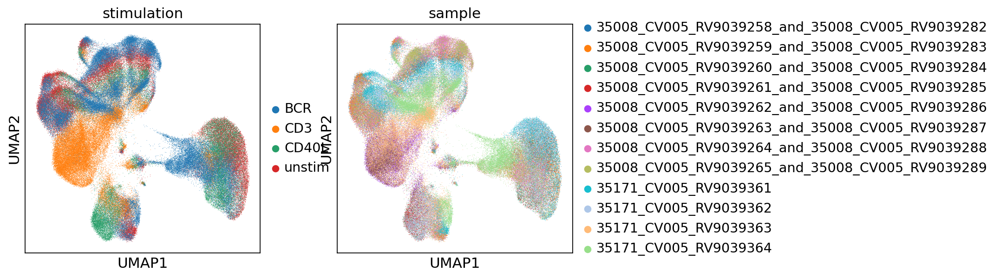

In [11]:
sc.pl.umap(adata, color=['stimulation','sample'])

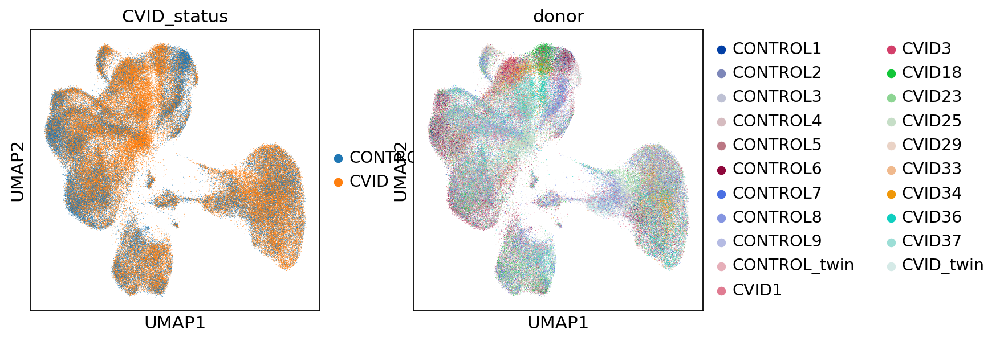

In [12]:
sc.pl.umap(adata, color=['CVID_status','donor'])

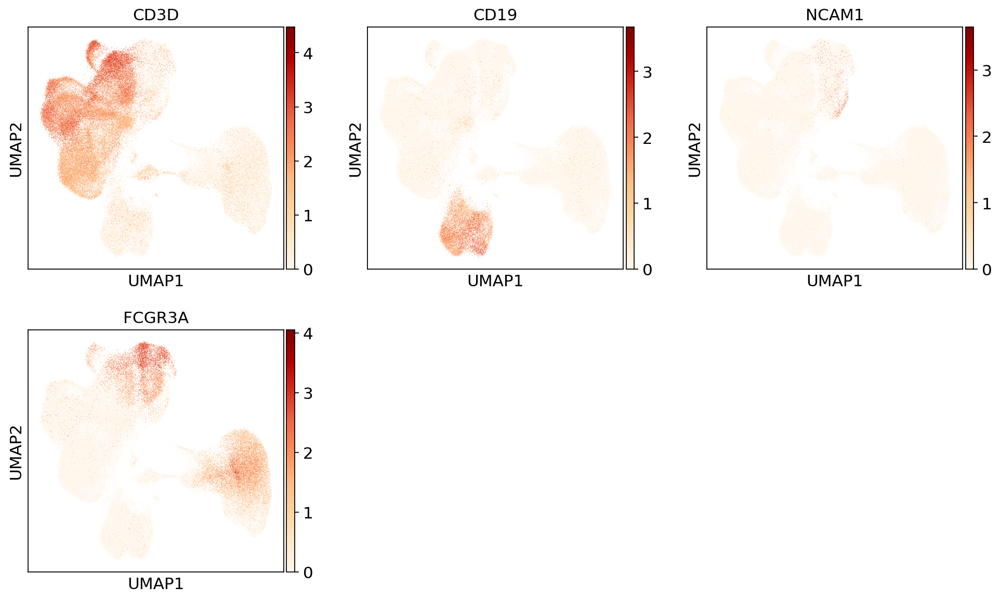

In [13]:
sc.pl.umap(adata, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

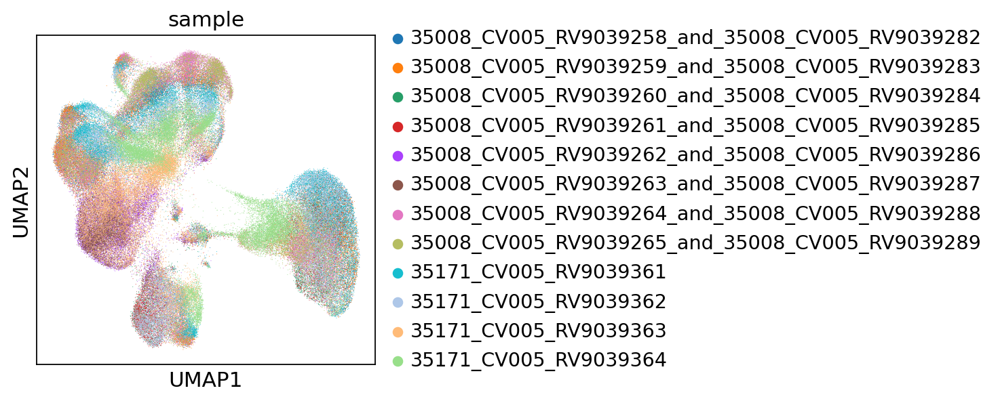

In [14]:
sc.pl.umap(adata, color=['sample'])

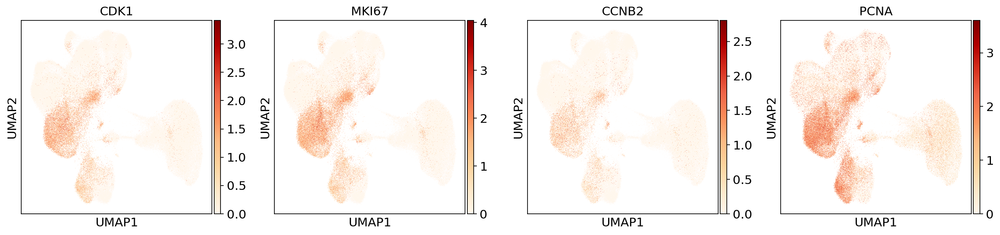

In [15]:
sc.pl.umap(adata, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [16]:
adata

AnnData object with n_obs × n_vars = 163320 × 2734
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'donor_ID_temp', 'louvain', 'is_doublet_propagate', 'probabilities', 'celltype_predictions', 'louvain_R_16', 'louvain_R_24', 'louvain_R_0', 'louvain_R_9', 'louvain_R_1', 'prelim_annot', 'n_counts_protein', 'n_counts_protein_lognorm', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-

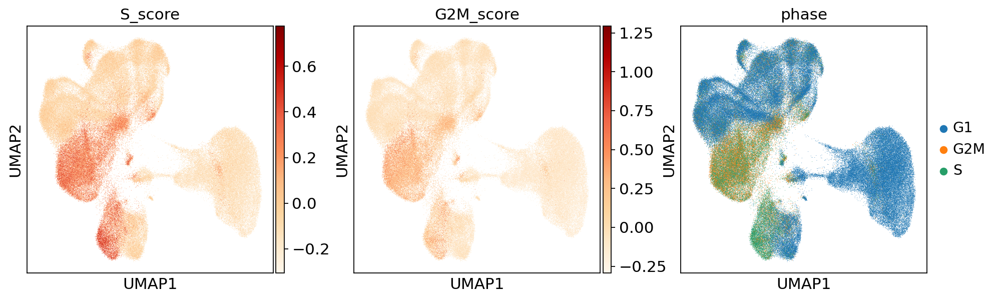

In [17]:
sc.pl.umap(adata, color=['S_score','G2M_score','phase'], cmap='OrRd')

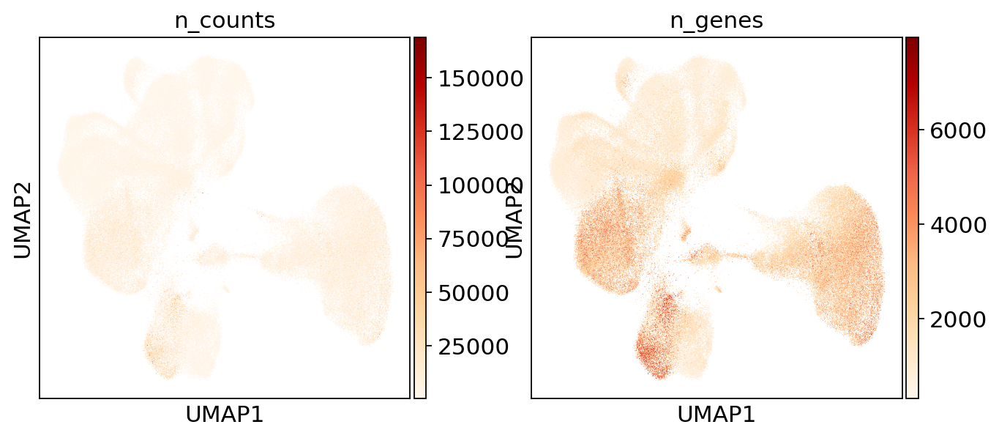

In [18]:
sc.pl.umap(adata, color=['n_counts',
                             'n_genes'], cmap='OrRd')

# Annotation

In [19]:
adata.obs['louvain'] = adata.obs['louvain'].astype(str)

... storing 'louvain' as categorical


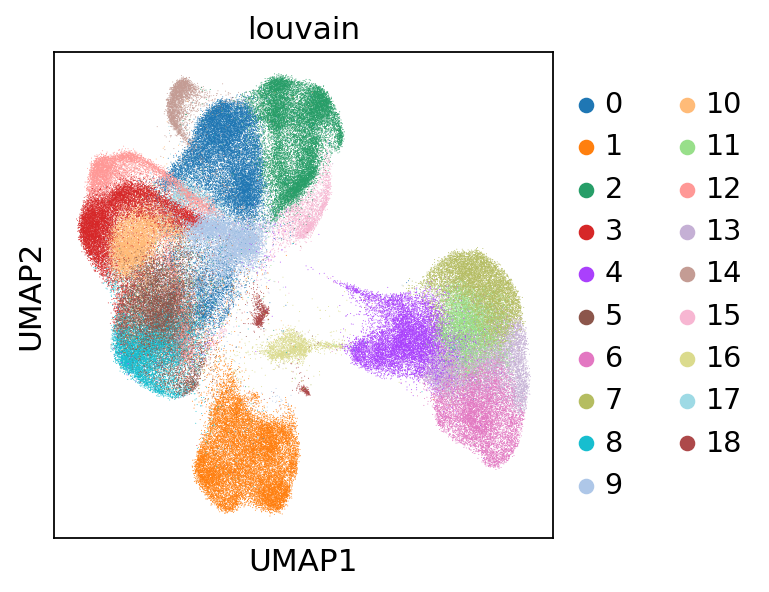

In [20]:
# here cluster 1 has been further analysed separately in the B cell manifold, so here we are just going to mark them as 'B_cells'
sc.pl.umap(adata, color=['louvain'])

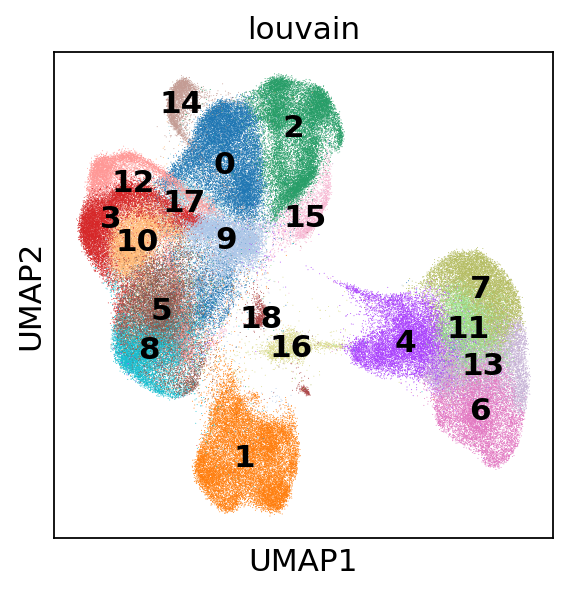

In [34]:
sc.pl.umap(adata, color=['louvain'], legend_loc='on data')

In [40]:
default_louvain_colors = adata.uns['louvain_colors']
default_louvain_colors

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a']

In [35]:
'JCHAIN' in adata.var_names

True

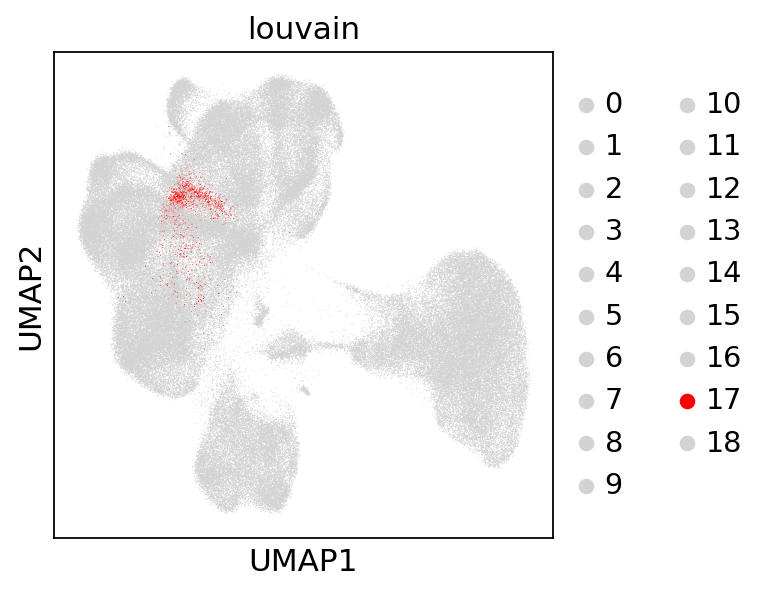

In [41]:
# MAIT cells are cluster 17
sc.pl.umap(adata, color=['louvain'], #legend_loc='on data'
           palette=['lightgrey']*17 + ['red'] + ['lightgrey']
          )

Clusters to zoom in on:
- 1 (B cells)
- 4
- 18
- 0
- 13
- 12

In [47]:
# zoom into cluster 1
sc.tl.louvain(adata, restrict_to=('louvain',['1']),
             key_added='louvain_R_1',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 22 clusters and added
    'louvain_R_1', the cluster labels (adata.obs, categorical) (0:00:04)


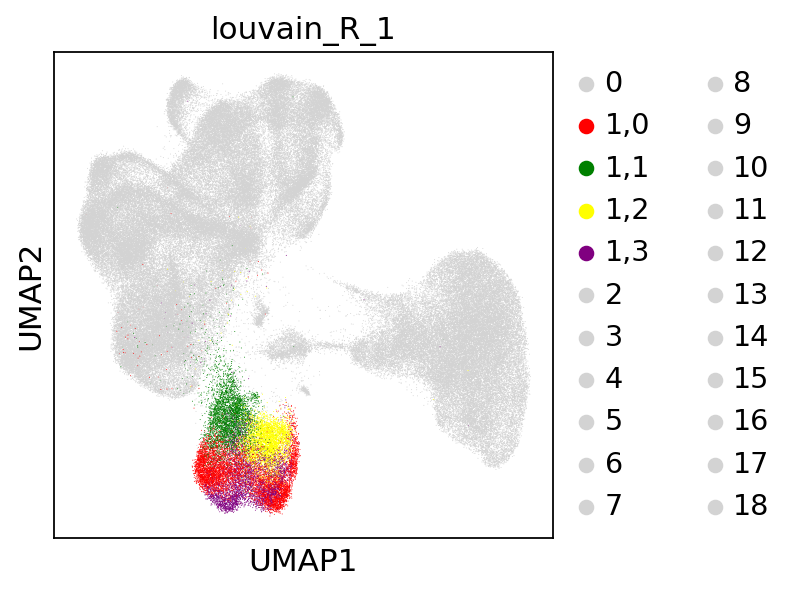

In [48]:
sc.pl.umap(adata, color=['louvain_R_1'], 
           #legend_loc='on data'
           palette=['lightgrey'] + ['red','green','yellow',
                                    'purple',
                                    #'blue',
                                      #'lightblue','purple'
                                     ] + ['lightgrey']*17
          )

In [49]:
# just a tiny bit further to see Plasma cells
sc.tl.louvain(adata, restrict_to=('louvain_R_1',['1,1']),
             key_added='louvain_R_1,1',
             resolution=0.9)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 26 clusters and added
    'louvain_R_1,1', the cluster labels (adata.obs, categorical) (0:00:00)


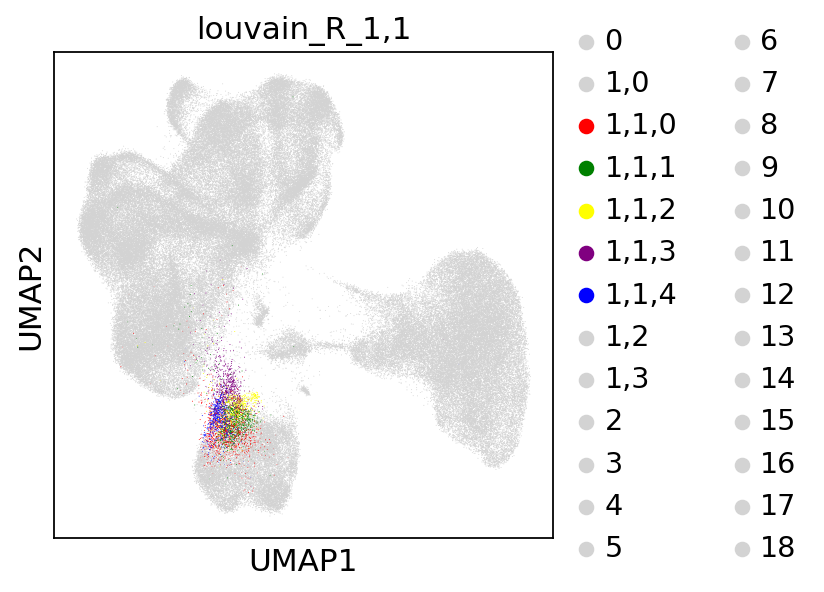

In [52]:
sc.pl.umap(adata, color=['louvain_R_1,1'], 
           #legend_loc='on data'
           palette=['lightgrey']*2 + ['red','green','yellow',
                                    'purple',
                                    'blue', #'lightblue',
                                      #'orange',
                                      #'lightblue','purple'
                                     ] + ['lightgrey']*19
          )

In [53]:
# 1,1,2 - Plasma_cells
# 1,0 and 1,3 - Naive B cells
# rest: 1,1,0; 1,1,1; 1,1,3; 1,1,4; 1,2 - Memory B cells

In [57]:
# zoom into cluster 4
sc.tl.louvain(adata, restrict_to=('louvain',['4']),
             key_added='louvain_R_4',
             resolution=0.9)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain_R_4', the cluster labels (adata.obs, categorical) (0:00:01)


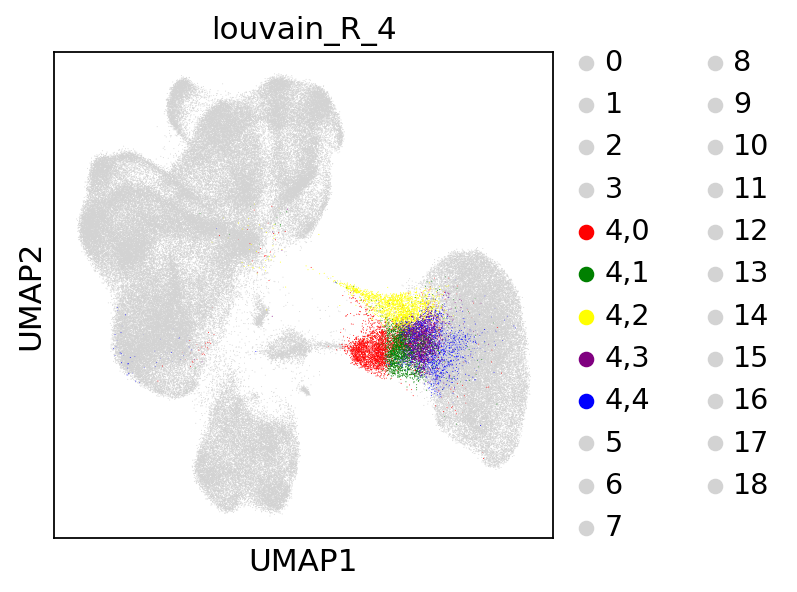

In [56]:
sc.pl.umap(adata, color=['louvain_R_4'], 
           #legend_loc='on data'
           palette=['lightgrey']*4 + ['red','green','yellow','purple','blue',
                                      #'lightblue','purple'
                                     ] + ['lightgrey']*14
          )

In [49]:
# 4,2 - doublets
# rest: 4,0; 4,1; 4,3; 4,4 - classical monocytes

In [59]:
# zoom into cluster 18
sc.tl.louvain(adata, restrict_to=('louvain',['18']),
             key_added='louvain_R_18',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 20 clusters and added
    'louvain_R_18', the cluster labels (adata.obs, categorical) (0:00:00)


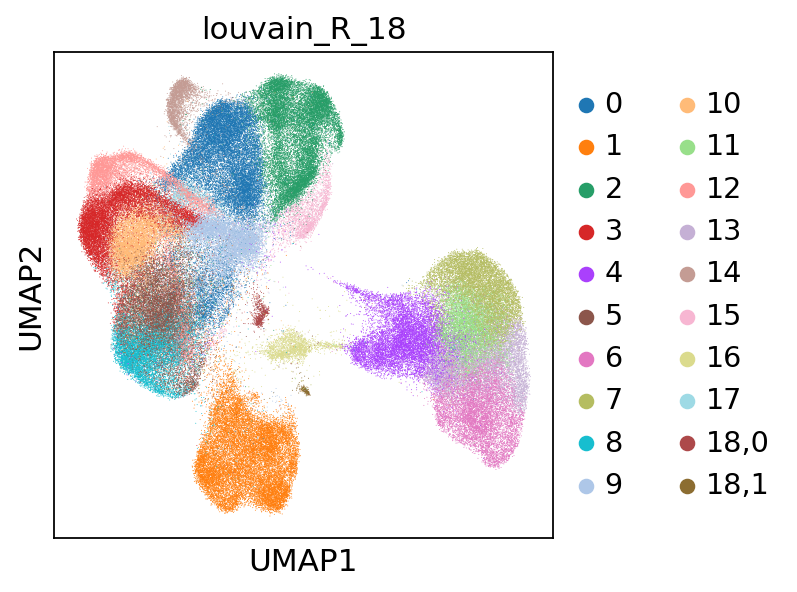

In [51]:
sc.pl.umap(adata, color=['louvain_R_18'], 
           #legend_loc='on data'
           #palette=['lightgrey'] + ['red','green','yellow','green','blue','lightblue','purple'] + ['lightgrey']*19
          )

In [ ]:
# 18,0 - precursor cells
# 18,1 - pDCs

In [61]:
# zoom into cluster 0
sc.tl.louvain(adata, restrict_to=('louvain',['0']),
             key_added='louvain_R_0',
             resolution=0.7)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain_R_0', the cluster labels (adata.obs, categorical) (0:00:03)


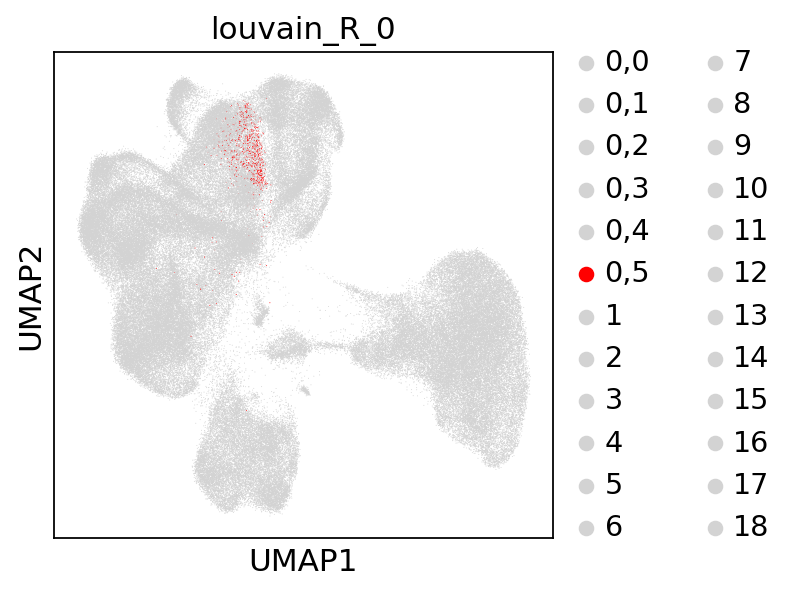

In [124]:
sc.pl.umap(adata, color=['louvain_R_0'],
           #legend_loc='on data'
           palette=['lightgrey']*5 + ['red',
                    #'green','yellow','purple','blue','lightblue',
                    #'pink'
                   ] + ['lightgrey']*18
          )

In [102]:
for Ab in list(adata.var[adata.var['feature_types-0'] == 'Antibody Capture'].index):
    if 'CD62L' in Ab:
        print(Ab)

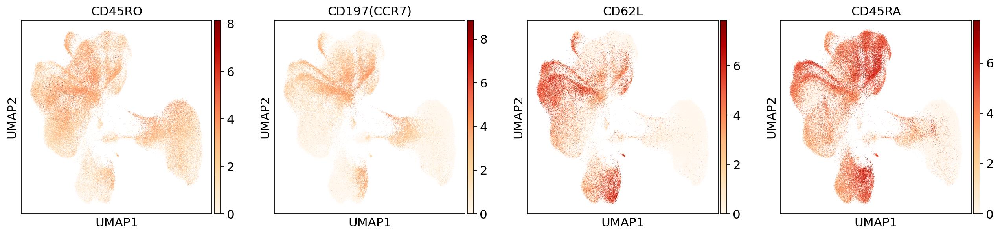

In [74]:
sc.pl.umap(adata, color=['CD45RO','CD197(CCR7)','CD62L','CD45RA'], cmap='OrRd', use_raw=True)

In [63]:
# 0,1; 0,3; 0,5 - TMRA CD8+ 
# 0,0 - TEM CD8+
# 0,2 - TCM CD8+
# 0,4 - Activated CD8+ T cells

In [64]:
# zoom into cluster 13
sc.tl.louvain(adata, restrict_to=('louvain',['13']),
             key_added='louvain_R_13',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 20 clusters and added
    'louvain_R_13', the cluster labels (adata.obs, categorical) (0:00:01)


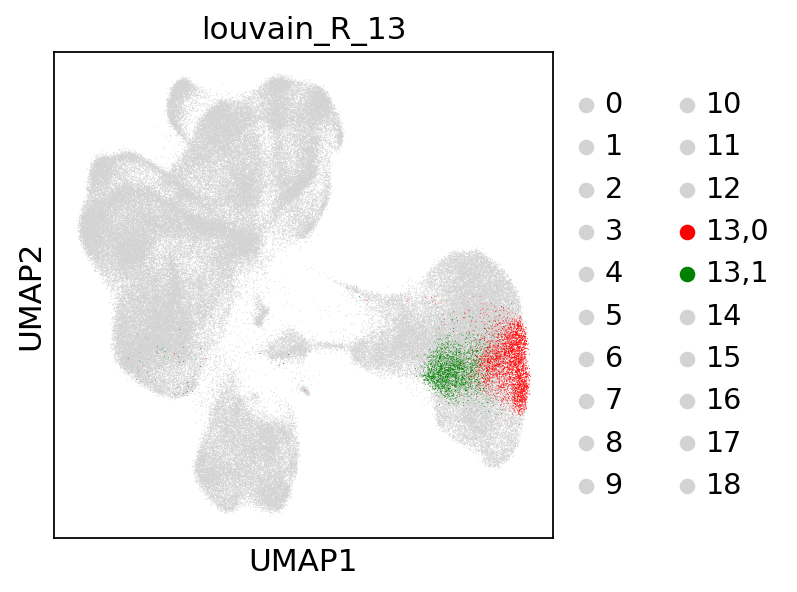

In [85]:
sc.pl.umap(adata, color=['louvain_R_13'], 
           #legend_loc='on data'
           palette=['lightgrey']*13 + ['red','green',
                                      #'yellow','green','blue','lightblue','purple'
                                     ] + ['lightgrey']*5
          )

In [104]:
for Ab in list(adata.var[adata.var['feature_types-0'] == 'Antibody Capture'].index):
    if 'CD163' in Ab:
        print(Ab)

CD163-1


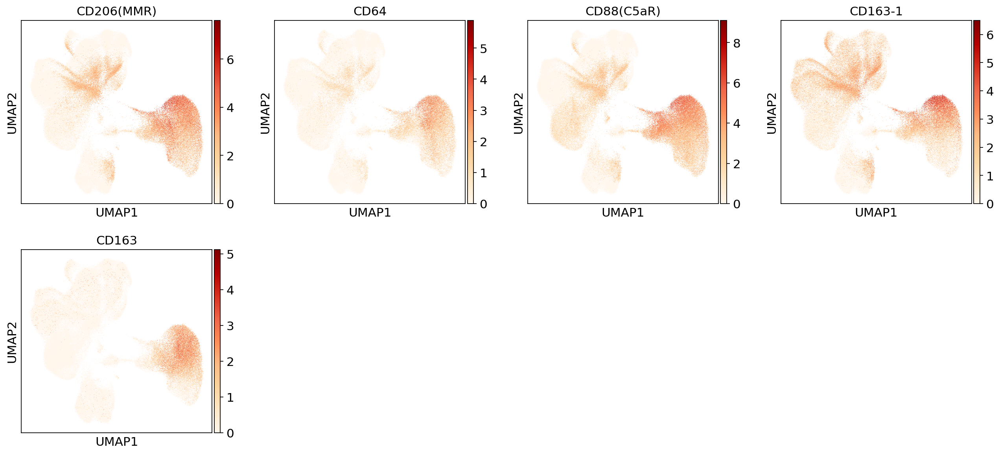

In [105]:
sc.pl.umap(adata, color=['CD206(MMR)','CD64','CD88(C5aR)', 'CD163-1', # proteins
                         'CD163', # gene
                        ], cmap='OrRd', use_raw=True)

In [75]:
# 13,0 - macrophages
# 13,1 - classicall monocytes

In [66]:
# zoom into cluster 12
sc.tl.louvain(adata, restrict_to=('louvain',['12']),
             key_added='louvain_R_12',
             resolution=0.9)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain_R_12', the cluster labels (adata.obs, categorical) (0:00:00)


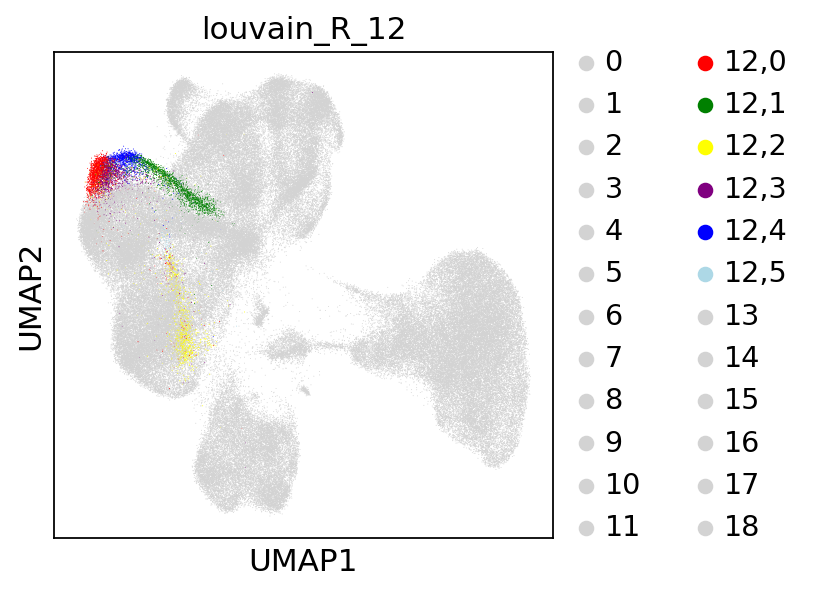

In [134]:
sc.pl.umap(adata, color=['louvain_R_12'], 
           #legend_loc='on data'
           palette=['lightgrey']*12 + ['red','green','yellow','purple','blue',
                                       'lightblue',
                                       #'lightblue'
                                     ] + ['lightgrey']*6
          )

In [49]:
# 12,2 - Activated CD8+ T cells
# rest: 12,0; 12,1; 12,3; 12,4; 12,5 - Naive CD8+ T cells

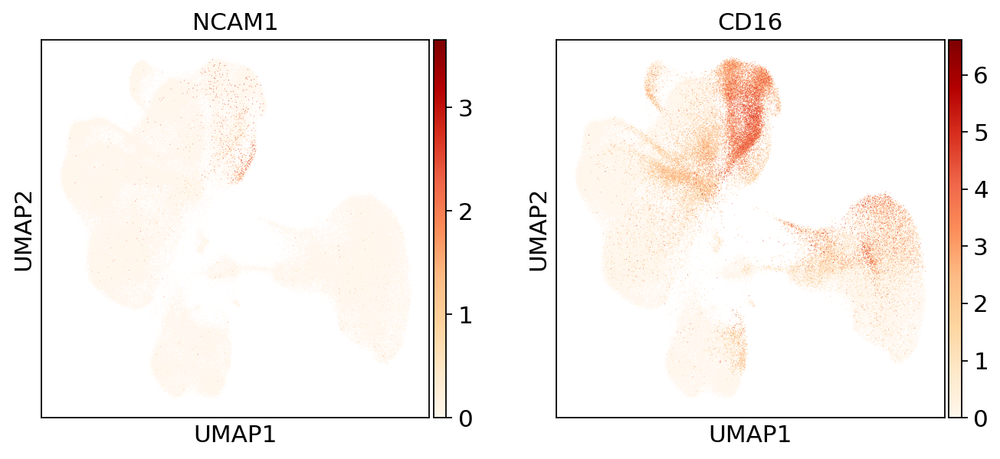

In [129]:
sc.pl.umap(adata, color=['NCAM1', # CD56
                         'CD16'], cmap='OrRd')

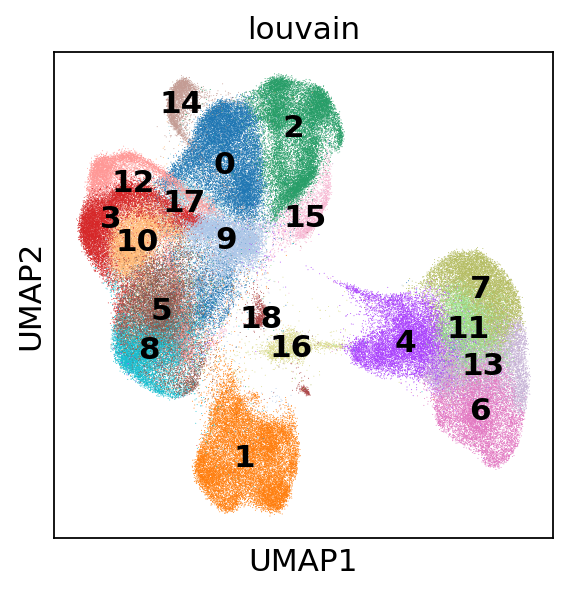

In [77]:
sc.pl.umap(adata, color=['louvain'], legend_loc='on data', palette=default_louvain_colors)

# Labelling

Clusters with zoom ins:
- 4
- 18
- 0
- 13
- 12

In [126]:
0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18

(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18)

In [68]:
def annot_prelim(adata_obj, barcode):
    
    # coarse louvain labels
    
    curr_louvain_coarse = adata_obj.obs.loc[barcode,'louvain']
    
    
    if curr_louvain_coarse == '0':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_0']
        # 0,1; 0,3; 0,5 - TMRA CD8+ 
        # 0,0 - TEM CD8+
        # 0,2 - TCM CD8+
        # 0,4 - Activated CD8+ T cells
        if zoomed_in_louvain in ['0,1','0,3','0,5']:
            return('TMRA_CD8+')
        elif zoomed_in_louvain == '0,0':
            return('TEM_CD8+')
        elif zoomed_in_louvain == '0,2':
            return('TCM_CD8+')
        elif zoomed_in_louvain == '0,4':
            return('T_cells_CD8+_activated')
        else:
            return('not_assigned_R_0')
        
    elif curr_louvain_coarse == '1':
        # 1,1,2 - Plasma_cells
        # 1,0 and 1,3 - Naive B cells
        # rest: 1,1,0; 1,1,1; 1,1,3; 1,1,4; 1,2 - Memory B cells
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_1,1']
        if zoomed_in_louvain == '1,1,2':
            return('Plasma_cells')
        elif zoomed_in_louvain in ['1,0','1,3']:
            return('B_cells_naive')
        elif zoomed_in_louvain in ['1,1,0','1,1,1','1,1,3','1,1,4','1,2']:
            return('B_cells_memory')
        
        return('B_cells')
    elif curr_louvain_coarse == '2':
        return('NK_CD16_bright')
    elif curr_louvain_coarse == '3':
        return('T_cells_CD4+_naive')
    
    elif curr_louvain_coarse == '4':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_4']
        # 4,2 - doublets
        # rest: 4,0; 4,1; 4,3; 4,4 - classical monocytes
        if zoomed_in_louvain == '4,2':
            return('doublets')
        elif zoomed_in_louvain in ['4,0','4,1','4,3','4,4']:
            return('Monocytes_Classical')
        else:
            return('not_assigned_R_4')

    elif curr_louvain_coarse == '5':
        return('T_cells_CD4+_activated')
    
    elif curr_louvain_coarse == '6':
        return('cDC2')
    elif curr_louvain_coarse == '7':
        return('Macrophages')
    elif curr_louvain_coarse == '8':
        return('T_cells_CD4+_activated')
    
    elif curr_louvain_coarse == '9':
        return('iNKT_cells')

    elif curr_louvain_coarse == '10':
        return('T_cells_CD4+_memory')
    elif curr_louvain_coarse == '11':
        return('Monocytes_CD16+')
    elif curr_louvain_coarse == '12':
        # 12,2 - Activated CD8+ T cells
        # rest: 12,0; 12,1; 12,3; 12,4; 12,5 - Naive CD8+ T cells
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_12']
        if zoomed_in_louvain == '12,2':
            return('T_cells_CD8+_activated')
        elif zoomed_in_louvain in ['12,0','12,1','12,3','12,4','12,5']:
            return('T_cells_CD8+_naive')
        else:
            return('not_assigned_R_12')
        
        
    elif curr_louvain_coarse == '13':
        # 13,0 - macrophages
        # 13,1 - classicall monocytes
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_13']
        if zoomed_in_louvain == '13,0':
            return('Macrophages')
        elif zoomed_in_louvain == '13,1':
            return('Monocytes_Classical')
        else:
            return('not_assigned_R_13')
    
    elif curr_louvain_coarse == '14':
        return('gdT_cells')
    
    elif curr_louvain_coarse == '15':
        return('NK_CD56_bright')
    
    elif curr_louvain_coarse == '16':
        return('cDC1')
    
    elif curr_louvain_coarse == '17':
        return('MAIT_cells')
    
    elif curr_louvain_coarse == '18':
        # 18,0 - precursor cells
        # 18,1 - pDCs
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_18']
        if zoomed_in_louvain == '18,0':
            return('Precursor_Cells')
        elif zoomed_in_louvain == '18,1':
            return('pDCs')
        else:
            return('not_assigned_R_18')
    
    
    else:
        return('not_assigned')
    

In [69]:
adata.obs['barcode'] = adata.obs.index

In [70]:
adata.obs['cell_type'] = adata.obs['barcode'].apply(lambda x: annot_prelim(adata,x))

... storing 'cell_type' as categorical


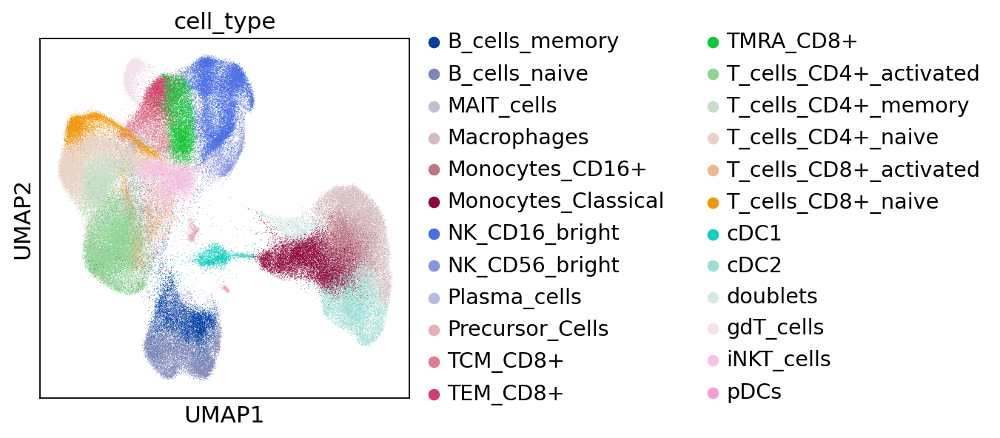

In [71]:
sc.pl.umap(adata, color='cell_type')

In [72]:
sc.settings.set_figure_params(dpi=80,
                             figsize=[10,10])  # low dpi (dots per inch) yields small inline figures

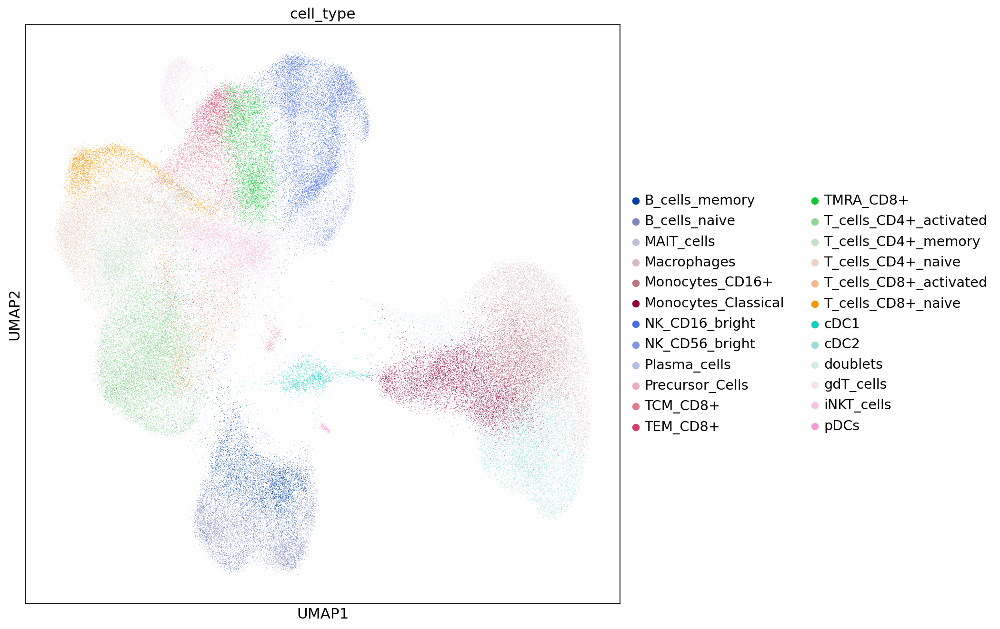

In [73]:
sc.pl.umap(adata, color='cell_type')

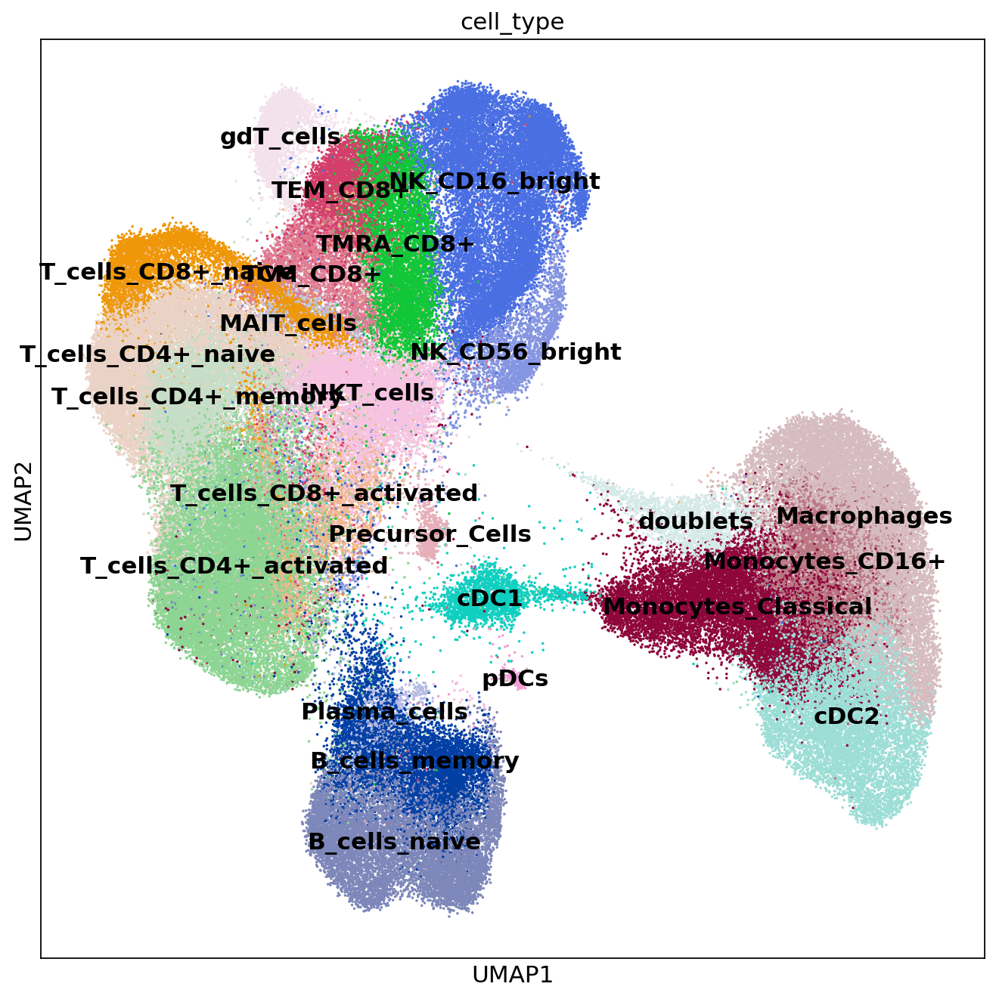

In [74]:
sc.pl.umap(adata, color='cell_type', legend_loc='on data', legend_fontweight='bold',
          size=10)

In [78]:
# also adding labels of doublets by BCR and doublets by TCR
doublets_BCR = pd.read_csv(save_path + 'doublets_by_BCR_table_20210106.csv', index_col=0)
doublets_TCR = pd.read_csv(save_path + 'doublets_by_TCR_table_20210106.csv', index_col=0)

In [80]:
doublets_BCR.shape

(163320, 1)

In [81]:
doublets_TCR.shape

(163320, 1)

In [82]:
np.unique(doublets_BCR['doublets_by_BCR'], return_counts=True)

(array([False,  True]), array([160951,   2369]))

In [83]:
np.unique(doublets_TCR['doublets_by_TCR'], return_counts=True)

(array([False,  True]), array([149897,  13423]))

In [84]:
def add_BCR_TCR_doublet_labels(adata_obj, barcode):
    
    curr_cell_type = adata_obj.obs.loc[barcode, 'cell_type']
    
    # priority to doublets by BCR over those by TCR but it's not important anyway, they are going to be excluded
    if doublets_BCR.loc[barcode, 'doublets_by_BCR']:
        return('doublets_by_BCR')
    elif doublets_TCR.loc[barcode, 'doublets_by_TCR']:
        return('doublets_by_TCR')
    else:
        return(curr_cell_type)

In [87]:
adata.obs['cell_type_final'] = adata.obs['barcode'].apply(lambda x: add_BCR_TCR_doublet_labels(adata, x))

... storing 'cell_type_final' as categorical


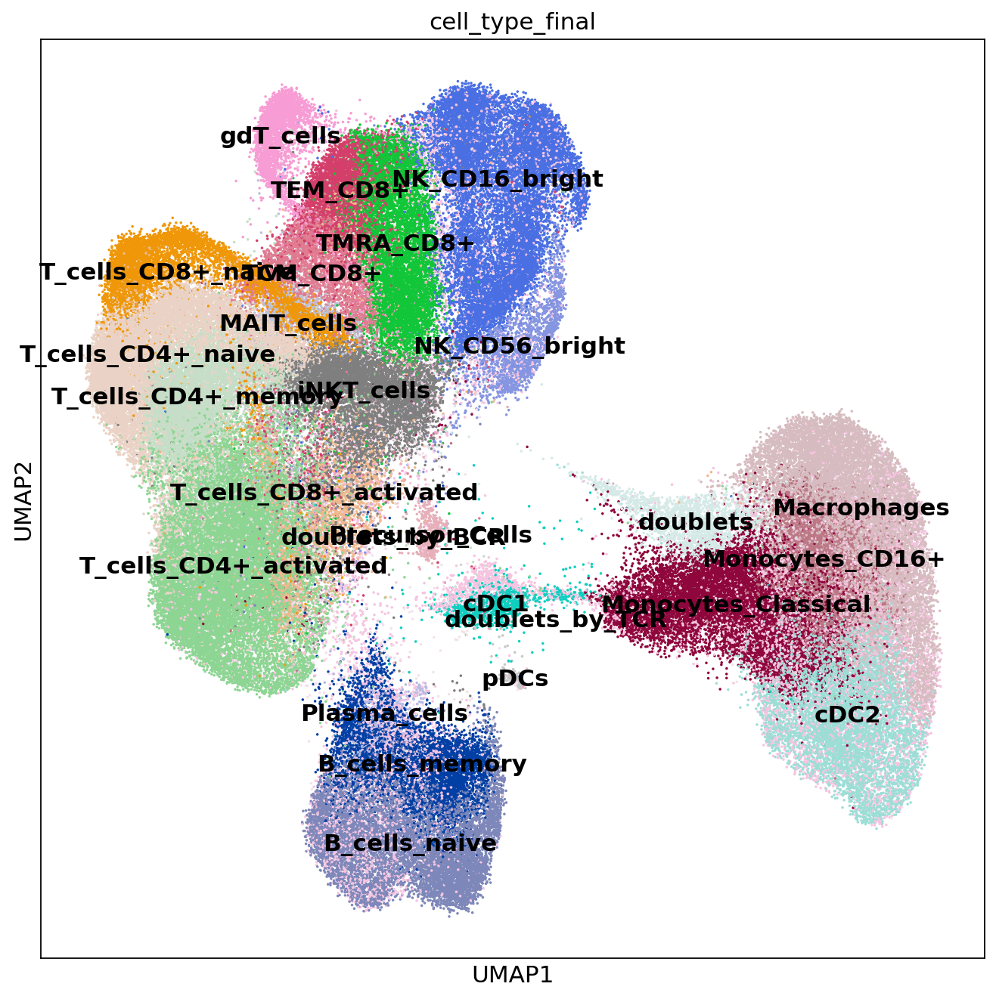

In [88]:
sc.pl.umap(adata, color='cell_type_final', legend_loc='on data', legend_fontweight='bold',
          size=10)

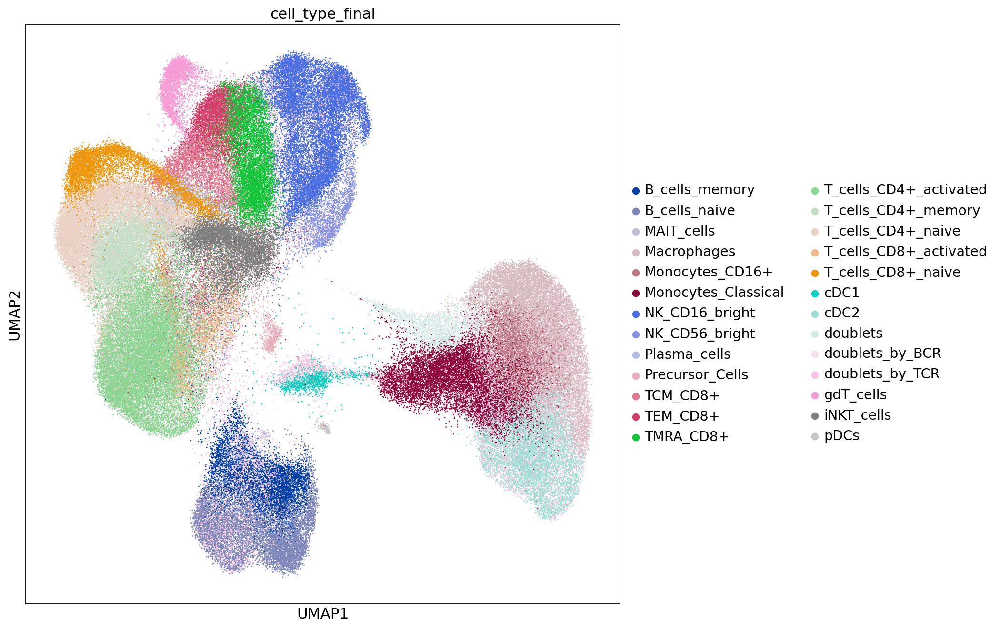

In [92]:
sc.pl.umap(adata, color='cell_type_final', 
           #legend_loc='on data', legend_fontweight='bold',
          size=6
          )

In [94]:
annot_table = adata.obs.loc[:,['cell_type_final']]

In [95]:
annot_table.head()

,cell_type_final
AAACCTGAGAATGTGT-1,Monocytes_CD16+
AAACCTGAGACTAAGT-1,cDC2
AAACCTGAGCCGCCTA-1,TCM_CD8+
AAACCTGAGCGCCTCA-1,TEM_CD8+
AAACCTGAGGATGTAT-1,TEM_CD8+


In [97]:
np.unique(annot_table['cell_type_final'])

array(['B_cells_memory', 'B_cells_naive', 'MAIT_cells', 'Macrophages',
       'Monocytes_CD16+', 'Monocytes_Classical', 'NK_CD16_bright',
       'NK_CD56_bright', 'Plasma_cells', 'Precursor_Cells', 'TCM_CD8+',
       'TEM_CD8+', 'TMRA_CD8+', 'T_cells_CD4+_activated',
       'T_cells_CD4+_memory', 'T_cells_CD4+_naive',
       'T_cells_CD8+_activated', 'T_cells_CD8+_naive', 'cDC1', 'cDC2',
       'doublets', 'doublets_by_BCR', 'doublets_by_TCR', 'gdT_cells',
       'iNKT_cells', 'pDCs'], dtype=object)

In [98]:
annot_table.to_csv(save_path + 'annotation_of_adata_hvg_BBKNN_GEX_and_SoupX_denoised_protein_all_samples_20210108.csv')

--> to notebok M2-2a

# DE with limma

In [128]:
# creating also the full object (all genes) - only normalised and log transformed
adata_all_full = anndata.AnnData(X=adata.raw.X,
                            obs=adata.obs,
                            var=adata.raw.var,
                            obsm=adata.obsm)

In [129]:
np.unique(adata_all_full.obs['annot'])

array(['B_cells', 'Class_Monocytes', 'Interm_Monocytes', 'MAIT_cells',
       'NKT_cells', 'NK_CD56_bright', 'NK_CD56_bright_activated',
       'NK_CD56_dim', 'NK_CD56_dim_activated', 'Non-class_Monocytes',
       'Plasma_cells', 'Precursor_cells', 'T4_memory',
       'T4_memory_activated', 'T4_naive', 'T4_naive_activated',
       'T8_memory', 'T8_memory_activated', 'T8_naive',
       'T8_naive_activated', 'cDC', 'gdT_cells', 'not_assigned_R_1'],
      dtype=object)

In [131]:
# want to have a look at CD4+ T cell compartment
adata_CD4_T = adata_all_full[adata_all_full.obs['annot'].isin(['T4_memory',
       'T4_memory_activated', 'T4_naive', 'T4_naive_activated'])]

In [132]:
adata_CD4_T

View of AnnData object with n_obs × n_vars = 24660 × 20209
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor_ID_temp', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'prelim_annot', 'probabilities', 'celltype_predictions', 'barcode', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status', 'louvain_R_1', 'louvain_R_5', 'louvain_R_7', 'louvain_R_17', 'louvain_R_3', 'louvain_R_3,4', 'annot'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature

In [133]:
# marker calling

#t = adata_hvg.X.toarray().T
t = adata_CD4_T.X.toarray().T
df = pd.DataFrame(data=t, columns= adata_CD4_T.obs.index, index=adata_CD4_T.var_names)

meta_df = pd.DataFrame(data={'Cell':list(adata_CD4_T.obs.index),
                             'cell_type':[ str(i) for i in adata_CD4_T.obs['CVID_status']],
                             'sample':[ str(i) for i in adata_CD4_T.obs['sample']]})
meta_df.set_index('Cell', inplace=True)

In [134]:
meta_df

,cell_type,sample
Cell,,
AAACCTGAGGCTAGCA-1,CONTROL,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGAGTACTTGC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGAGTTCGATC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGCACCAGTTA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGCACGACGAA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
...,...,...
TTTGGTTTCTTGTCAT-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
TTTGTCAAGGCCCGTT-1,CVID,35008_CV005_RV9039265_and_35008_CV005_RV9039289
TTTGTCAAGTACGATA-1-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289


In [135]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['CONTROL', 'CVID'], dtype=object), array([14277, 10383]))

In [136]:
%load_ext rpy2.ipython

In [137]:
outpath = './10X_B_cells_DE_limma/'

In [138]:
%%R
library(limma)
library(edgeR)

In [139]:
meta_df.reset_index(inplace=True)

In [140]:
meta_df

,Cell,cell_type,sample
0,AAACCTGAGGCTAGCA-1,CONTROL,35008_CV005_RV9039258_and_35008_CV005_RV9039282
1,AAACCTGAGTACTTGC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
2,AAACCTGAGTTCGATC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
3,AAACCTGCACCAGTTA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
4,AAACCTGCACGACGAA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
...,...,...,...
24655,TTTGGTTTCTTGTCAT-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24656,TTTGTCAAGGCCCGTT-1,CVID,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24657,TTTGTCAAGTACGATA-1-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24658,TTTGTCAGTCTTCTCG-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289


In [141]:
# because R replace '-' with '.' in df for some reason
def rename_Cell(cell_id):
    return(cell_id.replace('-','.'))

In [142]:
meta_df['Cell'] = meta_df['Cell'].apply(lambda x: rename_Cell(x))

In [143]:
meta_df

,Cell,cell_type,sample
0,AAACCTGAGGCTAGCA.1,CONTROL,35008_CV005_RV9039258_and_35008_CV005_RV9039282
1,AAACCTGAGTACTTGC.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
2,AAACCTGAGTTCGATC.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
3,AAACCTGCACCAGTTA.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
4,AAACCTGCACGACGAA.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
...,...,...,...
24655,TTTGGTTTCTTGTCAT.1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24656,TTTGTCAAGGCCCGTT.1,CVID,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24657,TTTGTCAAGTACGATA.1.1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24658,TTTGTCAGTCTTCTCG.1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289


In [144]:
df

index,AAACCTGAGGCTAGCA-1,AAACCTGAGTACTTGC-1,AAACCTGAGTTCGATC-1,AAACCTGCACCAGTTA-1,AAACCTGCACGACGAA-1,AAACCTGTCAATACCG-1,AAACGGGAGAACTGTA-1,AAACGGGTCGGTCCGA-1,AAACGGGTCTTTAGTC-1,AAAGATGAGGTGGGTT-1,...,TTTGGTTCAGCCTATA-1,TTTGGTTCAGTTCATG-1,TTTGGTTGTAGCAAAT-1-1,TTTGGTTGTGAAATCA-1,TTTGGTTTCCGCATAA-1,TTTGGTTTCTTGTCAT-1,TTTGTCAAGGCCCGTT-1,TTTGTCAAGTACGATA-1-1,TTTGTCAGTCTTCTCG-1,TTTGTCATCGCTGATA-1
index,,,,,,,,,,,,,,,,,,,,,
RP11-34P13.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FO538757.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AP006222.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP4-669L17.10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP5-857K21.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC091133.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TENM2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP11-22A3.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [145]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['CONTROL', 'CVID'], dtype=object), array([14277, 10383]))

In [146]:
# doing for all nonCVID B cells, comparing GC-like B cells vs other B cells
case = 'CVID'
ctrl = 'CONTROL'

In [147]:
%%R -i df -i meta_df -i outpath -i ctrl -i case 

library(limma)
library(edgeR)

# Format
ex_mat=as.matrix(df)
rownames(meta_df) = meta_df$Cell

# subset meta
meta_df = subset(meta_df, cell_type %in% unlist(c(ctrl, case)) )
print(unique(meta_df$cell_type))

# Shared cells
shared_cells = intersect(rownames(meta_df), colnames(ex_mat))
message(length(shared_cells), ' shared cells')
ex_mat = ex_mat[, shared_cells]
meta_df = meta_df[shared_cells,]

# Filter lowly expressed genes
keep = rowSums(ex_mat, na.rm=T) > 0.1
ex_mat = ex_mat[ keep, ]
keep = aveLogCPM(ex_mat) > 0.1
ex_mat = ex_mat[ keep, ]

# Extract celltypes
cells = rownames(meta_df)
celltypes = unique(meta_df$cell_type)
covariates = meta_df$covariate

# Extract cells in cluster and rest
cells_case = rownames(subset(meta_df, cell_type == case))
cells_ctrl = rownames(subset(meta_df, cell_type == ctrl)) # changed from control to ctrl

# build cluster_type vector
cluster_type = rep(0, length(cells))
names(cluster_type) = cells
cluster_type[ cells_case ] = 'case'
cluster_type[ cells_ctrl ] = 'ctrl'

print(unique(cluster_type))

#design.matrix <- model.matrix(~ 0 + cluster_type + covariates)
design.matrix <- model.matrix(~ 0 + cluster_type)

# Now tell limma how do you want to compare (i.e. case vs control)
contrast.matrix <- makeContrasts(caseVScontrol = cluster_typecase - cluster_typectrl, levels = design.matrix)

# Make model and run contrasts
fit <- lmFit(ex_mat, design.matrix)
fit <- contrasts.fit(fit, contrast.matrix)
fit <- eBayes(fit)

# Make a dataframe containing the important data
results = topTable(fit, adjust="fdr", number = nrow(ex_mat), coef = 'caseVScontrol')

# Add and filter needed data
results$Gene = rownames(results)
results = results[ , c('Gene', 'logFC', 'P.Value', 'adj.P.Val')]
results$AveExpr_cluster = apply(ex_mat[ results$Gene, cells_case], 1, mean)
results$AveExpr_rest = apply(ex_mat[ results$Gene, cells_ctrl], 1, mean)
results$percentExpr_cluster = apply(ex_mat[ results$Gene, cells_case], 1, function(x) sum(c(x > 0)+0) ) / length(cells_case)
results$percentExpr_rest = apply(ex_mat[ results$Gene, cells_ctrl], 1, function(x) sum(c(x > 0)+0) ) / length(cells_ctrl)

results$AveExpr_cluster = round(results$AveExpr_cluster, 6)
results$AveExpr_rest = round(results$AveExpr_rest, 6)
results$percentExpr_cluster = round(results$percentExpr_cluster, 6)
results$percentExpr_rest = round(results$percentExpr_rest, 6)
# and store it as csv file
write.csv(results, file = paste0(outpath, case, '_vs_', ctrl, '_CD4_T_cells_limma_DEGs.csv'), row.names = F, col.names = T, quote = F)

[1] "CONTROL" "CVID"   


R[write to console]: 24660 shared cells



[1] "ctrl" "case"


In [148]:
DE_table = pd.read_csv('./10X_B_cells_DE_limma/CVID_vs_CONTROL_CD4_T_cells_limma_DEGs.csv', index_col=0)

In [151]:
for gene in DE_table.index:
    if 'CD40' in gene:
        print(gene)

CD40LG
CD40-1
CD40


In [152]:
DE_table.loc['CD40LG']

logFC                 -6.672630e-02
P.Value                3.208165e-15
adj.P.Val              4.016276e-13
AveExpr_cluster        2.488950e-01
AveExpr_rest           3.156220e-01
percentExpr_cluster    1.577580e-01
percentExpr_rest       1.958390e-01
Name: CD40LG, dtype: float64

In [154]:
adata_CD4_T

View of AnnData object with n_obs × n_vars = 24660 × 20209
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor_ID_temp', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'prelim_annot', 'probabilities', 'celltype_predictions', 'barcode', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status', 'louvain_R_1', 'louvain_R_5', 'louvain_R_7', 'louvain_R_17', 'louvain_R_3', 'louvain_R_3,4', 'annot'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature

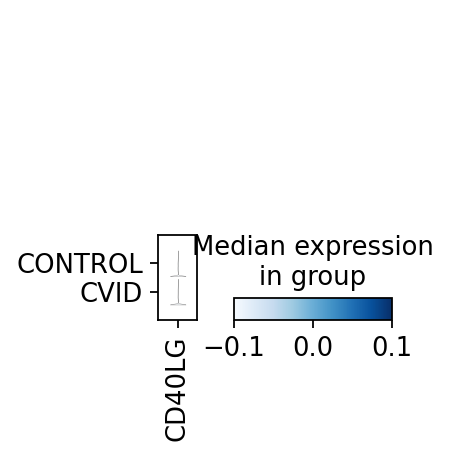

In [155]:
sc.pl.stacked_violin(adata_CD4_T, 
                         ['CD40LG'],
                         groupby = 'CVID_status',
                    save='_CD4_T_cells_violin_plot.pdf')

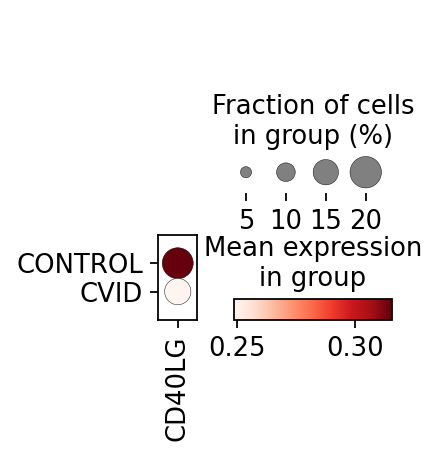

In [156]:
sc.pl.dotplot(adata_CD4_T, 
                         ['CD40LG'],
                         groupby = 'CVID_status',
                    save='_CD4_T_cells.pdf')

Trying to set attribute `.uns` of view, copying.


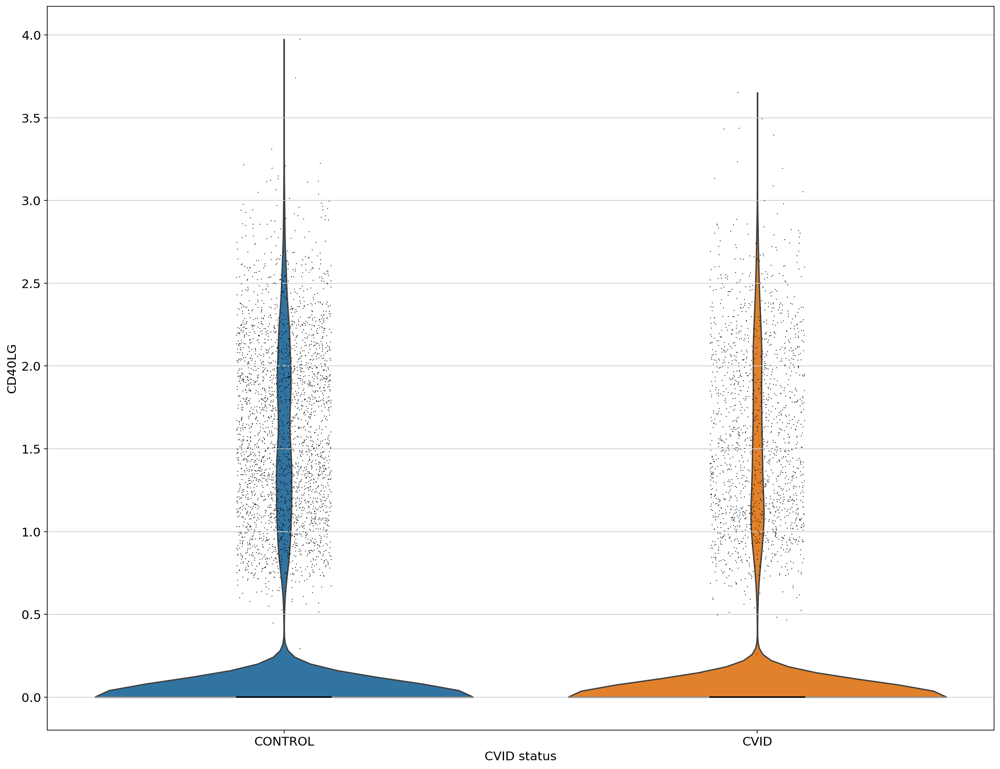

In [157]:
sc.pl.violin(adata_CD4_T, 
                         ['CD40LG'],
                         groupby = 'CVID_status',
                    save='_CD4_T_cells.pdf')

In [153]:
DE_table

,logFC,P.Value,adj.P.Val,AveExpr_cluster,AveExpr_rest,percentExpr_cluster,percentExpr_rest
Gene,,,,,,,
RPS4Y1,6.406594e-01,0.000000e+00,0.000000e+00,1.493042,0.852383,0.678609,0.407018
MT2A,-3.728604e-01,3.539666e-108,3.279147e-104,0.940054,1.312915,0.428585,0.512433
XIST,-8.877900e-02,1.751247e-101,1.081570e-97,0.010996,0.099775,0.007416,0.066471
MT1E,-1.889162e-01,9.035516e-96,4.185251e-92,0.237521,0.426437,0.155543,0.255446
RPS26,-3.226608e-01,1.854109e-93,6.870586e-90,2.530541,2.853202,0.819127,0.892274
...,...,...,...,...,...,...,...
ZNF837,-3.682926e-07,9.996968e-01,9.999109e-01,0.003428,0.003428,0.002504,0.002171
TTF1,-1.162249e-06,9.998228e-01,9.999109e-01,0.104146,0.104148,0.068381,0.072774
RIMS3,1.123980e-07,9.998713e-01,9.999109e-01,0.001879,0.001879,0.001348,0.001401


In [ ]:
# if not, try to only compare only activated T cell states

In [90]:
# to get the barcode-sample column stored here as 'cell_id'
adata_raw_filtered = sc.read(save_path+'adata_raw_filtered.h5ad')

In [91]:
adata.obs['barcode_sample'] = adata_raw_filtered.obs.loc[adata.obs.index,'cell_id']

In [95]:
adata.obs['prelim_annot']

index
AAACCTGAGAATGTGT-1      Monocyte-derived_cells
AAACCTGAGACTAAGT-1                         DCs
AAACCTGAGCCGCCTA-1                  MAIT_cells
AAACCTGAGCGCCTCA-1                   T8_memory
AAACCTGAGGATGTAT-1                   T8_memory
                                 ...          
TTTGTCATCATCGATG-1      Monocyte-derived_cells
TTTGTCATCATCGCTC-1                         NK1
TTTGTCATCCTTAATC-1                         NK1
TTTGTCATCGCTGATA-1                    T8_naive
TTTGTCATCTAACTCT-1-1                 Monocytes
Name: prelim_annot, Length: 92749, dtype: category
Categories (21, object): [B_cells, DCs, MAIT_cells, Monocyte-derived_cells, ..., T8_memory, T8_naive, T8_naive_activated, gdT]

In [99]:
for sample in np.unique(adata.obs['sample']):
    print(sample)
    curr_data = adata[adata.obs['sample'] == sample]
    annot_df = pd.DataFrame(index=curr_data.obs['barcode_sample'])
    annot_df['cell_type'] = list(curr_data.obs['prelim_annot'])
    annot_df.index = [elem.split('_')[0] for elem in annot_df.index]
    print(annot_df)
    annot_df.to_csv('./annot_tables_for_SoupX/20201008_prelim_annot_8_samples_annot_sample_'+sample+'.csv')

35008_CV005_RV9039258_and_35008_CV005_RV9039282
                                 cell_type
AAACCTGAGAATGTGT-1  Monocyte-derived_cells
AAACCTGAGACTAAGT-1                     DCs
AAACCTGAGCCGCCTA-1              MAIT_cells
AAACCTGAGCGCCTCA-1               T8_memory
AAACCTGAGGATGTAT-1               T8_memory
...                                    ...
TTTGTCATCTAACCGA-1      T8_naive_activated
TTTGTCATCTATCCCG-1                T8_naive
TTTGTCATCTCAAGTG-1                     DCs
TTTGTCATCTCTGAGA-1                T4_naive
TTTGTCATCTGTTGAG-1  Monocyte-derived_cells

[13571 rows x 1 columns]
35008_CV005_RV9039259_and_35008_CV005_RV9039283
                                 cell_type
AAACCTGAGACACTAA-1                T4_naive
AAACCTGAGATTACCC-1  Monocyte-derived_cells
AAACCTGAGCACCGCT-1                T8_naive
AAACCTGAGCATCATC-1              MAIT_cells
AAACCTGAGCGTCTAT-1                     DCs
...                                    ...
TTTGTCATCGGTTAAC-1  Monocyte-derived_cells
TTTGTCATCGTAGGAG-1